# Basketball Lineup Plus-minus Prediction Via Regression


##### Kole Laviolette 72088131
##### Jerry Qi 73382533
##### Junru Chen 74767625
##### Suryansh Aggarwal 86345881

In [38]:
library(tidyverse)
library(tidymodels)
library(GGally)
library(gtable)
install.packages("plotly")
library("plotly")
library("cowplot")
install.packages("rgl")
library("rgl")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

This build of rgl does not include OpenGL functions.  Use
 rglwidget() to display results, e.g. via options(rgl.printRglwidget = TRUE).



## Introduction 

In basketball, there is a statistic called the “plus-minus” (short-handed to “+/-”) that refers to the sum of all of the points scored while they were on the court, minus the sum of all the points they let the opposing team score. This statistic is a good quantifiable value for the overall effect of a line in a basketball game, and it can be used to determine the best line for a team to play in a game. The  biggest  advantage  of  plus/minus  statistics  is  that  they  account  for  a player's  contributions  that  are  not  tracked  by  the  box  score. 
In our project, our group is trying to approximate the plus-minus of a certain line in a basketball game using the general statistics of a line during a game.

Our dataset contains the statistics of various NBA lineups. In every row of our dataset, there are the team names, players in a certain lineup, and all recorded statistics during the game such as the points scored, three-point shots made, minutes played, etc.

<img src="https://media1.giphy.com/media/xTiTnpcaFPfJAzaP8A/giphy.gif?cid=ecf05e47vmgx3augez5b3eixpieipismv4h1zt1trjuv3zx9&rid=giphy.gif&ct=g" width = "400"/>

Source : https://media1.giphy.com/media/xTiTnpcaFPfJAzaP8A/giphy.gif?cid=ecf05e47vmgx3augez5b3eixpieipismv4h1zt1trjuv3zx9&rid=giphy.gif&ct=g

## Preliminary exploratory data analysis

#### The predictors we initially plan to choose from are listed below:

Generally, people think the more points players get, or the higher hit rate players have, the more positive effect they will have, so we will use PTS (points scored) and FGP (hit rate percentage of all shots) as two predictors.

##### `PTS` : points scored

##### `FGP` : hit rate percentage of all shots

For professional statistics who know more about basketball and dig research on each game, they will consider PIR (an addition index consisting of positive actions minus negative actions), TSP (an index that balances points, field goal attempts, and free throw attempts), PPP (an index calculates points per possession is an advanced statistic that attempts to measure the number of points a player generates for each possession of the ball) can influence the effect of players on the game, so we will use these three indexes as predictors.

##### `PIR` (Performance Index Ranking) = (Points + Rebounds + Assists + Steals + Blocks + Fouls Drawn) - (Missed Field Goals + Missed Free Throws + Turnovers + Shots Rejected + Fouls Committed) :

The Performance Index Rating (PIR) is a statistical measure derived from a complex formula that takes the sum of all of a players positive actions, and minuses their negitive actions. 

##### `TSP` (True Shooting Percentage) = Points ÷ ((2 x Field Goal Attempts) + (0.88 x Free Throw Attempts) : 

The true shooting percentage is a statistical measure used in basketball to evaluate a player's efficiency as a scorer. It is calculated by dividing the total number of points scored by the total number of shots attempted, including field goals, free throws, and three-point shots.


##### `PPP` (Points Per Possession) = Points ÷ (Field Goal Attempts + (0.44 x Free Throw Attempts) + Turnovers) : 

The points per possession is a statistical measure used in basketball to evaluate the efficiency of a team's offense or a player's scoring ability. It is calculated by dividing the total number of points scored by the total number of possessions used.

#### Data Ananlysis

To do an exploratory analysis of our data set and answer our predictive question, we decided to choose predictors and perform a knn regression and a linear regression to compare which regression model could better predict the P_M value based on same predictors. We began by loading our data from the original source from the internet and reading the data frame in Juptyer. The data was then cleaned to display only desired columns and rows using select and mutate, such that important information was kept and organized properly, and any information that was not needed was discarded.

In [2]:
lineup_stat <- read_csv("https://raw.githubusercontent.com/JerryQi77/DSCI_Group-Project/main/DSCI_Group_project?token=GHSAT0AAAAAABZQJWZPOUAKKT7OY7UAZ33IY2546GQ")

Rows: 250 Columns: 30
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (6): TEAM, First Player, Second Player, Third Player, Fourth Player, Fi...
dbl (24): ...1, GP, MIN, PTS, FGM, FGA, FG%, 3PM, 3PA, 3P%, FTM, FTA, FT%, O...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Once the data is read, we first try to calculate the three extra advanced basketetball statistics, which are PIR, TSP and PPP, using official formulas listed above before discarding unused values.

In [3]:
colnames(lineup_stat)[colnames(lineup_stat) == "+/-"] <- "P_M"
colnames(lineup_stat)[colnames(lineup_stat) == "FG%"] <- "FGP"
lineup_stat_1 <- select(lineup_stat, GP:P_M)

lineup_stat_2 <- lineup_stat_1 |>
                 mutate(PIR = PTS + REB + AST + STL + BLK + PFD + FGM - FGA + FTM - FTA - TOV - BLKA - PF) |>
                 mutate(TSP = PTS / ((2 * FGA) + (0.88 * FTA))) |>
                 mutate(PPP = PTS / (FGA + (0.44 * FTA) + TOV))|>
                 select(PTS,FGP,PIR,TSP,PPP,P_M)

After adding extra variables and discarding useless information, the dataframe only contains Points Scored, Hit Rate Percentage of All Shots, Performance Index Ranking, True Shooting Percentage and Points Per Possesion. They are the predictors we plan to choose from. 

In [9]:
head(lineup_stat_2)

PTS,FGP,PIR,TSP,PPP,P_M
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
52.3,48.2,58.5,0.5658214,1.0171931,0.8
46.3,47.4,52.5,0.5564904,0.9645833,-0.9
45.4,49.4,51.5,0.5771382,1.0172074,3.4
44.0,51.3,56.1,0.6051937,1.0614687,5.4
40.9,49.0,47.7,0.5975339,1.0589271,2.2
36.2,45.1,42.5,0.5512914,0.9801798,1.7


The next step in our analysis was to randomly split the data into a training and testing set. Before spliting, we set our seed to 96 to ensure our work was reproducible. This step allows us to build our models with 75% of the data set (training) without being biased. We could then compare our results to the remaining 25% of the data set (testing) that was not manipulated. The training data was then displayed in a scatterplot matrix to show correlations.

In [4]:
set.seed(96)
lineup_split <- initial_split(lineup_stat_2, prop = 0.75, strata = P_M)
lineup_train <- training(lineup_split)
lineup_testing <- testing(lineup_split)

After setting our training dataset from the original dataset, we summarized our training data by calculating the total groups number, the mean value of our predictors and the value `P_M` that we want to preditct.

In [5]:
lineup_train_sum <- lineup_train|>select(PTS:P_M)|>summarize(total_groups = n(),PTS_mean=mean(PTS),FGP_mean=mean(FGP),PIR_mean=mean(PIR),TSP_mean=mean(TSP),PPP_mean=mean(PPP),P_M_mean=mean(P_M))
lineup_train_sum 

total_groups,PTS_mean,FGP_mean,PIR_mean,TSP_mean,PPP_mean,P_M_mean
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
186,17.02849,46.69892,19.02097,0.5632984,0.9865362,0.5612903


Then, we use ggpair to see the relationship between our five predictors and target value separately, and the distribution of our six values.

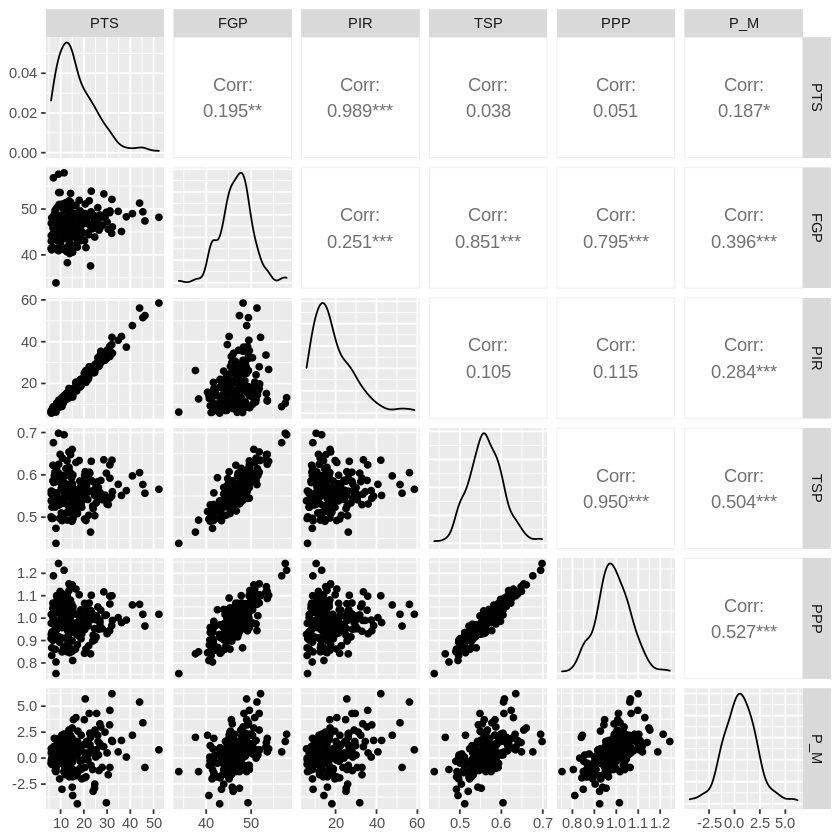

In [6]:
relationship <- lineup_train|>ggpairs()
relationship

>**Figure 1:** From ggpairs plot, the important information we can know about are the distribution of P_M, the scatterplots and the correlation values between PTS, FGP, PIR, TSP, PPP and P_M.

The scatterplots in ggpairs plot isn't obvious to read so let's put the scatterplots together for easier comparision.  

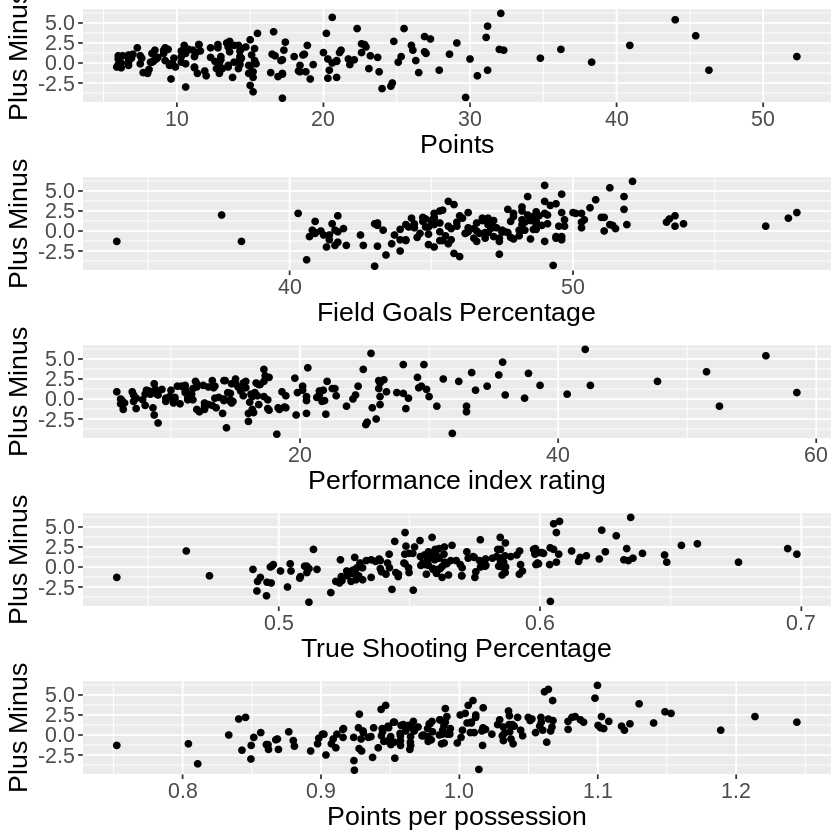

In [19]:
pts_plot <- ggplot(lineup_train, aes(x = PTS, y = P_M)) + geom_point() +
            xlab("Points") + ylab("Plus Minus") + theme(text = element_text(size=16))

fgp_plot <- ggplot(lineup_train, aes(x = FGP, y = P_M)) + geom_point() +
            xlab("Field Goals Percentage") + ylab("Plus Minus") + theme(text = element_text(size=16))

pir_plot <- ggplot(lineup_train, aes(x = PIR, y = P_M)) + geom_point() +
            xlab("Performance index rating") + ylab("Plus Minus") + theme(text = element_text(size=16))

tsp_plot <- ggplot(lineup_train, aes(x = TSP, y = P_M)) + geom_point() +
            xlab("True Shooting Percentage") + ylab("Plus Minus") + theme(text = element_text(size=16))

ppp_plot <- ggplot(lineup_train, aes(x = PPP, y = P_M)) + geom_point() +
            xlab("Points per possession") + ylab("Plus Minus") + theme(text = element_text(size=16))

plot_grid(pts_plot, fgp_plot, pir_plot,tsp_plot, ppp_plot, ncol=1)

From the ggpairs graph and the scatterplots, it's very clear that the correlation values between PPP, TSP and P_M are both roughly 0.5 which is a lot bigger than values of other variables, such as 0.18, 0.28 and 0.39, and the scatterplots also show the stronger relationship in certain pattern between them so they would be better predictors than others.

Since we only have two predictors, we can draw the 3D scatterplot based on TSP, PPP and P_M 

In [36]:
figure_3D <- plot_ly(lineup_train, x = ~TSP, y = ~PPP, z = ~P_M, 
               marker = list(size=3, color = ~'rgba(56, 121, 235, 0.6)', showscale = FALSE))
figure_3D <- figure_3D %>% add_markers()
figure_3D <- figure_3D %>% layout(scene = list(xaxis = list(title = 'True shooting percentage'),
                                   yaxis = list(title = 'Points per possession'),
                                   zaxis = list(title = 'Plus Minus')))
figure_3D

HTML widgets cannot be represented in plain text (need html)

let's first start to do K-NN regression with these two predictors. Since we don't know the exact number of neighbors which would bring the best outcome, we should find out the neighbors first by applying cross-validation on our training data to split our training dataset equally into five different subsets in order to compair the different performance of $k$ values.

First, we set our model as $k$-nn regression and create recipe using PPP and TSP as predictors, using training data to make sure testing data won't involve. We also scale all the predictors because we want our predictors can equally affected the predicted value despite the magnitudes of predictors' own values.

After creating model and recipe, we add them into the workflow function, which helps to run the regression model using neighbors from 1 to 30 on the five subsets to see the results of all the neighbors.

In [22]:
set.seed(96)
lineup_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |> 
      set_engine("kknn") |>
      set_mode("regression") 

lineup_recipe <- recipe(P_M ~ PPP + TSP, data = lineup_train) |>
      step_scale(all_predictors()) |>
      step_center(all_predictors())

lineup_vfold <- vfold_cv(lineup_train, v = 5, strata = P_M)

gridvals <- tibble(neighbors = seq(1, 30))

lineup_results <- workflow() |> 
    add_recipe(lineup_recipe) |> 
    add_model(lineup_spec) |>
    tune_grid(resamples = lineup_vfold, grid = gridvals) |> 
    collect_metrics()

In the context of $k$-nn *regression*, we use RMPSE instead of accuracy in classification. If the prediction values are very close to the true values, the RMSPE will be small. Conversely, if the prediction values are *not* very close to the true values, the RMSPE will be quite large. In other words, the neighbor that would bring the smallest RMSE would be our best choice for neighbors. 

From the chart and the distribution of rmse based on $k$ value below, it's pretty clear that $k=18$ would be the best choice for our K-NN model.


neighbors,.metric,.estimator,mean,n,std_err,.config
<int>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
18,rmse,standard,1.445318,5,0.07487702,Preprocessor1_Model18


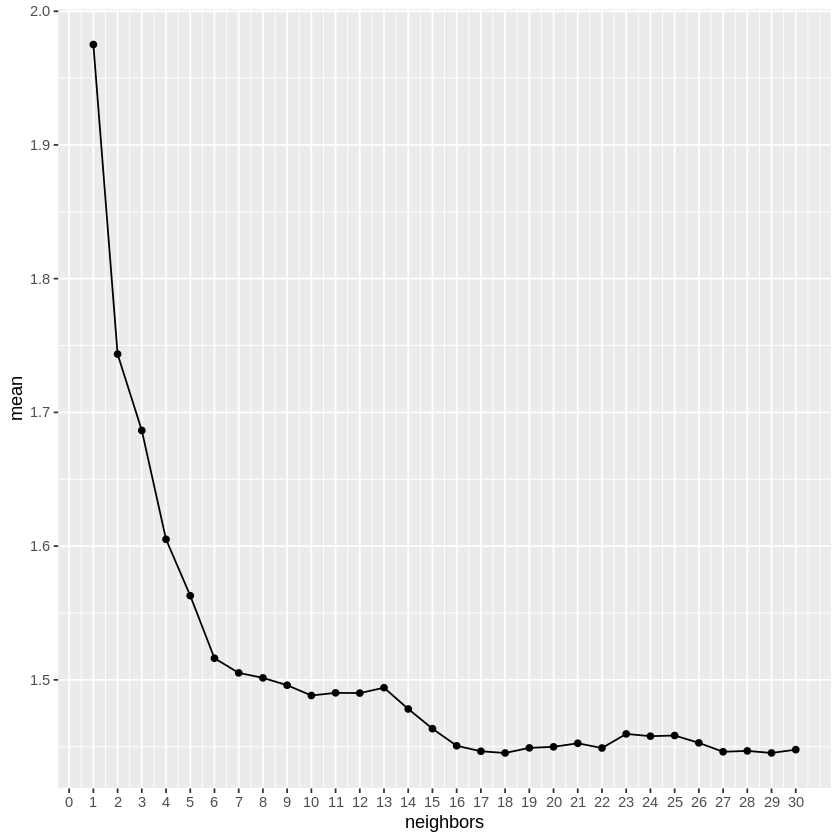

In [33]:
# show only the row of minimum RMSPE
lineup_min <- lineup_results |>
   filter(.metric == "rmse") |>
   arrange(mean) |> 
   head(1)

result_plot <- lineup_results |>
               filter(.metric == "rmse") |>
               ggplot(aes(x=neighbors,y=mean)) + geom_point() + geom_line() + scale_x_continuous(breaks = seq(0, 30, by = 1))

result_plot


lineup_min


k_min <- lineup_min |>
         pull(neighbors)

>**Table & Graph 1:** From the table and graph, we can easily know that the smallest rmse, which is 1.445318, happends when the value for neighbors is 18.

After knowing the best choice of $k$, let's bring it back to our regression model by creating and using the new lineup_spec based on $k=18$ to see how it would perform on our testing dataset. 

In [35]:
lineup_best_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = k_min) |>
         set_engine("kknn") |>
         set_mode("regression")

lineup_best_fit <- workflow() |>
         add_recipe(lineup_recipe) |>
         add_model(lineup_best_spec) |>
         fit(data = lineup_train)

lineup_summary <- lineup_best_fit |>
          predict(lineup_testing) |>
          bind_cols(lineup_testing) |>
          metrics(truth = P_M, estimate = .pred)

From the chart below we can see that the best rmse is 1.792903 so our $k$-nn regression model doesn't seem to be good because 1.793 rmse is big since most value of P_M is between $-2.5$ and $3$ from graph 1, so we would next try linear regression to see if RMSE would be better.

In [26]:
lineup_summary|>filter(.metric == "rmse")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,1.792903


Just like $k$-nn regression, we set proper model for linear regression and create recipe using PPP and TSP as predictors on training data.  

In [28]:
lineup_spec <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

lineup_recipe <- recipe(P_M ~ PPP + TSP, data = lineup_train)

We add them into workflow function and see how's the linear regression model generated based on training data.

In [29]:
lineup_fit <- workflow() |>
  add_recipe(lineup_recipe) |>
  add_model(lineup_spec) |>
  fit(data = lineup_train)
lineup_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: linear_reg()

── Preprocessor ────────────────────────────────────────────────────────────────
0 Recipe Steps

── Model ───────────────────────────────────────────────────────────────────────

Call:
stats::lm(formula = ..y ~ ., data = data)

Coefficients:
(Intercept)          PPP          TSP  
    -10.758       10.671        1.407  


From the result of `lineup_fit`, we can write the mathematical formula below for our predicted plane.

$PM = 10.671 * Points Per Possession + 1.407* True Shooting Percentage - 10.758$

Then, we use our regression model on testing data to see the rmse.

In [39]:
lineup_test_results <- lineup_fit |>
  predict(lineup_testing) |>
  bind_cols(lineup_testing) |>
  metrics(truth = P_M, estimate = .pred)

lineup_test_results

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,1.7533693
rsq,standard,0.3349985
mae,standard,1.1921460


>**Table2 :** this table shows that the rmse for the linear regression model is 1.7533693

With the values and formula, we can draw the 3D graph for our predicted plane

In [40]:
x <- seq(0,5, length=3)
y <- seq(0,1, length=3)
f <- function(x,y){z <- x * 10.671  + y * 1.407 - 10.758}
distMatrix <- outer(0:5,0:1,f)
fig <- plot_ly(z = ~distMatrix, showscale=FALSE) %>%
       layout(scene = list(xaxis = list(title = 'True shooting percentage'),
                                   yaxis = list(title = 'Points per possession'),
                                   zaxis = list(title = 'Plus Minus')))
fig <- fig %>% add_surface() 
fig

HTML widgets cannot be represented in plain text (need html)

In [ ]:
There goes the summary

## APA Cited References

[1] : Fromal, A. (2017, October 3). Understanding the NBA: Explaining Advanced Comprehensive Stats and Metrics. Bleacher Report.
              https://bleacherreport.com/articles/1040320-understanding-the-nba-explaining-advanced-comprehensive-stats-and-metrics


[2] : Kubatko, Justin; Oliver, Dean; Pelton, Kevin; and Rosenbaum, Dan T. (2007) 
            "A Starting Point for Analyzing Basketball Statistics," Journal of Quantitative Analysis in Sports : 
             Vol. 3: Iss. 3, Article 1
 